<a href="https://colab.research.google.com/github/qubvel/transformers-notebooks/blob/main/notebooks/DFine_inference.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Inference with D-Fine

In this notebook, we'll perform inference with the [D-Fine](https://huggingface.co/docs/transformers/main/model_doc/d_fine) object-detection model.

D-FINE is a powerful real-time object detector that redefines the bounding box regression task in DETRs as Fine-grained Distribution Refinement (FDR) and introduces Global Optimal Localization Self-Distillation (GO-LSD), achieving outstanding performance without introducing additional inference and training costs.


![](https://raw.githubusercontent.com/Peterande/storage/master/figs/stats_padded.png)

 - Paper: https://arxiv.org/abs/2410.13842

## Set-up environment

Let's start by upgrading 🤗 Transformers as the model is brand new at the time of writing.

In [1]:
!export HF_HOME="/media/zuppif/Cancro/huggingface"

In [1]:
!pip install --upgrade git+https://github.com/huggingface/transformers
!uv pip install --upgrade numpy==1.*

# NOTE: you might need to restart your env to apply updates

Defaulting to user installation because normal site-packages is not writeable
  Cloning https://github.com/huggingface/transformers to /tmp/pip-req-build-vn_oonav
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers /tmp/pip-req-build-vn_oonav
  Resolved https://github.com/huggingface/transformers to commit feec294dea831568068ea90f729b2be3a253b024
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 30.6 MB/s eta 0:00:00
  Created wheel for transformers: filename=transformers-4.53.0.dev0-py3-none-any.whl size=11337317 sha256=db46d03917bb1aee312421ea7a3db6d8d65abb0c7d94148a4b6dfbf7b496f926
  Stored in directory: /tmp/pip-ephem-wheel-cache-z45k_cjg/wheels/49/a7/50/c9fdabbf10e51bb1256adb0c1a587fedd7184f5bad28d47fe3
Successfully built transformers
  Attempting uninstall: huggingface-hub
    Found existing inst

## Load model and image processor

We'll load an D-Fine checkpoint from the [hub](https://huggingface.co/ustc-community). Note that the authors have released 6 different checkpoints which leverage various settings. Here we load one that leverages a [HGNet-50](https://huggingface.co/docs/transformers/en/model_doc/hgnet_v2) backbone which has been trained on COCO dataset.

In [2]:
import torch
from transformers import AutoImageProcessor, AutoModelForObjectDetection

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Pretrained on Object365 dataset first, then trained on COCO
checkpoint = "ustc-community/dfine-medium-obj365"

# Alternative checkpoints:
#   - https://huggingface.co/models?other=d_fine&author=ustc-community
#
# For example:
# checkpoint = "ustc-community/dfine-xlarge-obj365"
# checkpoint = "ustc-community/dfine-large-obj365"

image_processor = AutoImageProcessor.from_pretrained(checkpoint)
model = AutoModelForObjectDetection.from_pretrained(checkpoint).to(device)

/media/zuppif/Cancro/open-omniparser-dataset/omniparser/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: cuda


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


## Load image

Next we'll load our image on which we'll perform inference.

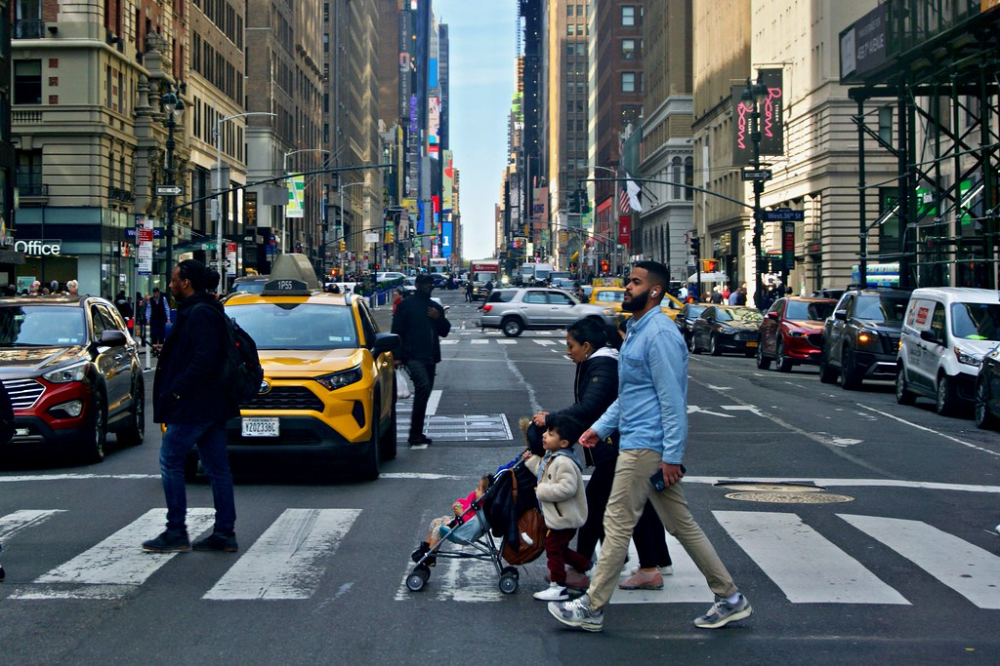

In [3]:
from PIL import Image
import requests

url = "https://live.staticflickr.com/65535/33021460783_1646d43c54_b.jpg"
image = Image.open(requests.get(url, stream=True).raw)
image

## Forward pass

The API is exactly the same as other object detection models in the Transformers library, which means that we first prepare the image for the model using the image processor, after which we forward the pixel values through the model in order to obtain class logits and predicted bounding boxes.

In [4]:
inputs = image_processor(image, return_tensors="pt")
inputs = inputs.to(device)

print(inputs.keys())

dict_keys(['pixel_values'])


In [6]:
import torch

with torch.no_grad():
    outputs = model(**inputs)

## Postprocess & visualize

Let's visualize the results! For that we first need to call the `post_process_object_detection` method on the image processor which turns the bounding box coordinates as predicted by the model in the Pascal VOC format, which is (xmin, ymin, xmax, ymax), adjusted for the size of the original image.

We also specify a threshold in order to only keep bounding box predictions for which the class prediction has a confidence of at least 0.3.

In [7]:
# postprocess model outputs
postprocessed_outputs = image_processor.post_process_object_detection(
    outputs,
    target_sizes=[(image.height, image.width)],
    threshold=0.3,
)
image_detections = postprocessed_outputs[0]  # take only first image results

Next we can visualize the results on the image using libraries like Matplotlib or OpenCV.

In [9]:
import matplotlib.pyplot as plt

# colors for visualization
COLORS = [
    [0.000, 0.447, 0.741],
    [0.850, 0.325, 0.098],
    [0.929, 0.694, 0.125],
    [0.494, 0.184, 0.556],
    [0.466, 0.674, 0.188],
    [0.301, 0.745, 0.933],
] * 100


def plot_results(pil_image, scores, labels, boxes, visible_classes=None):
    plt.figure(figsize=(16, 10))
    plt.imshow(pil_image)
    ax = plt.gca()
    for score, label, box, color in zip(scores, labels, boxes, COLORS):
        # skip not specified classes
        class_name = model.config.id2label[label]
        if visible_classes is not None and not class_name.lower() in visible_classes:
            continue

        xmin, ymin, xmax, ymax = box
        ax.add_patch(
            plt.Rectangle(
                (xmin, ymin),
                xmax - xmin,
                ymax - ymin,
                fill=False,
                color=color,
                linewidth=1,
            )
        )
        text = f"{class_name}: {score:0.2f}"
        ax.text(
            xmin,
            ymin,
            text,
            fontsize=8,
            bbox=dict(facecolor="yellow", alpha=0.25),
        )
    plt.axis("off")
    plt.show()

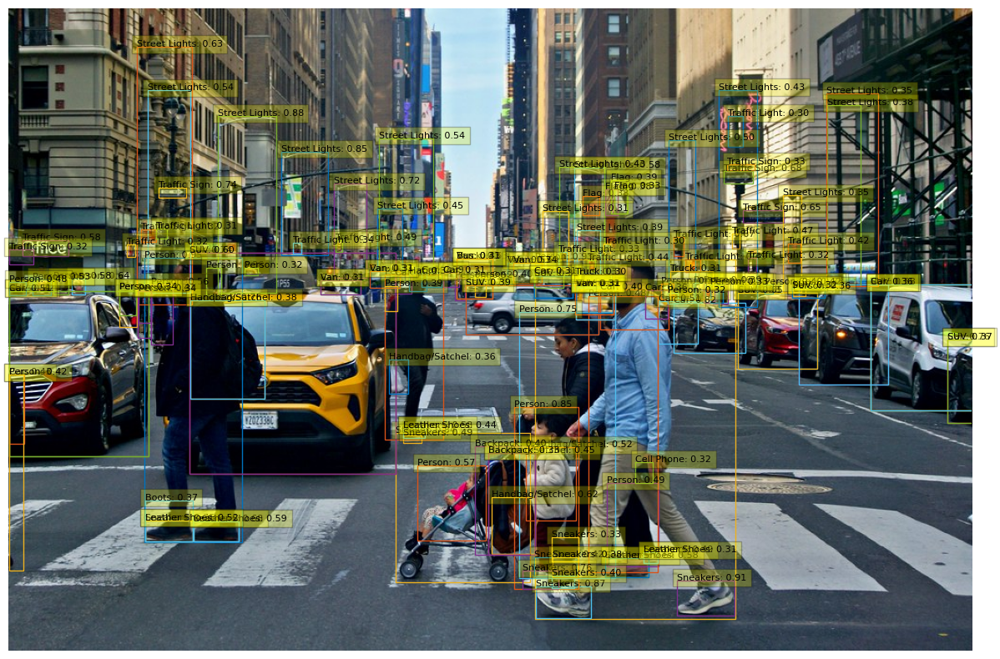

In [10]:
plot_results(
    pil_image=image,
    scores=image_detections["scores"].tolist(),
    labels=image_detections["labels"].tolist(),
    boxes=image_detections["boxes"].tolist(),
)

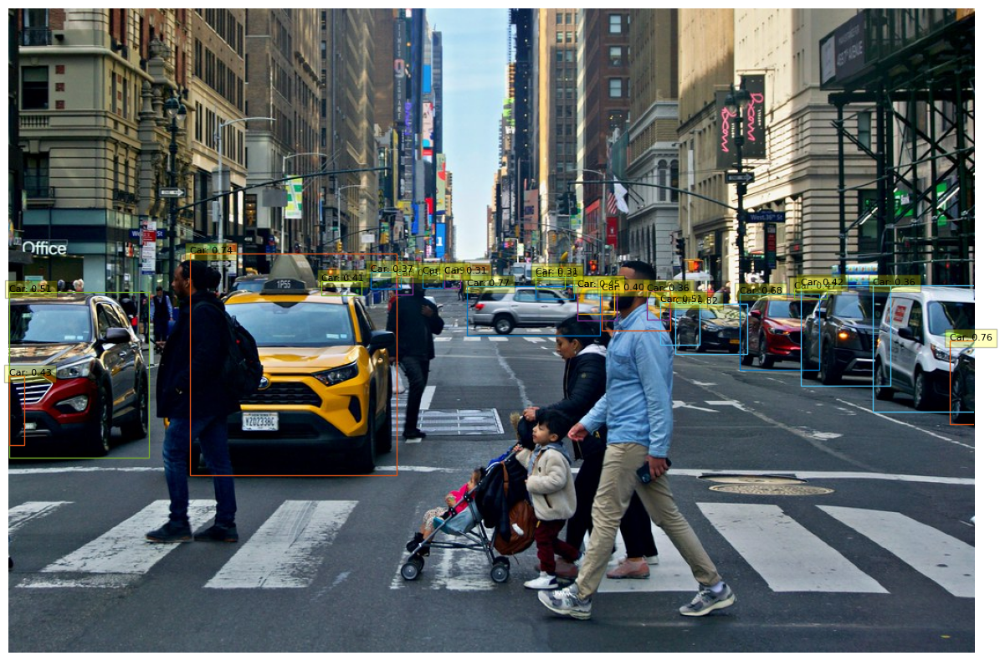

In [11]:
plot_results(
    pil_image=image,
    scores=image_detections["scores"].tolist(),
    labels=image_detections["labels"].tolist(),
    boxes=image_detections["boxes"].tolist(),
    visible_classes=["car"],
)

## Pipeline API

Alternatively, if you don't want to implement the pre- and postprocessing yourself, the Transformers library offers the [pipeline abstraction](https://huggingface.co/docs/transformers/en/main_classes/pipelines) which does all of what we did above for you. Usage is really easy:

In [12]:
from transformers import pipeline

pipe = pipeline("object-detection", model=checkpoint, image_processor=checkpoint)

Device set to use cuda:0


In [18]:
results = pipe(url, threshold=0.3)

In [19]:
results

[{'score': 0.9529481530189514,
  'label': 'Person',
  'box': {'xmin': 144, 'ymin': 265, 'xmax': 247, 'ymax': 567}},
 {'score': 0.9448123574256897,
  'label': 'Person',
  'box': {'xmin': 399, 'ymin': 282, 'xmax': 462, 'ymax': 458}},
 {'score': 0.9305450916290283,
  'label': 'Person',
  'box': {'xmin': 558, 'ymin': 266, 'xmax': 771, 'ymax': 648}},
 {'score': 0.9096782803535461,
  'label': 'Sneakers',
  'box': {'xmin': 710, 'ymin': 607, 'xmax': 771, 'ymax': 645}},
 {'score': 0.8827792406082153,
  'label': 'Street Lights',
  'box': {'xmin': 221, 'ymin': 113, 'xmax': 284, 'ymax': 301}},
 {'score': 0.8710887432098389,
  'label': 'Sneakers',
  'box': {'xmin': 560, 'ymin': 614, 'xmax': 618, 'ymax': 648}},
 {'score': 0.846574604511261,
  'label': 'Street Lights',
  'box': {'xmin': 289, 'ymin': 151, 'xmax': 339, 'ymax': 261}},
 {'score': 0.8458104133605957,
  'label': 'Person',
  'box': {'xmin': 537, 'ymin': 423, 'xmax': 604, 'ymax': 616}},
 {'score': 0.8359348773956299,
  'label': 'Stroller',
 

We can visualize the results in a similar way:

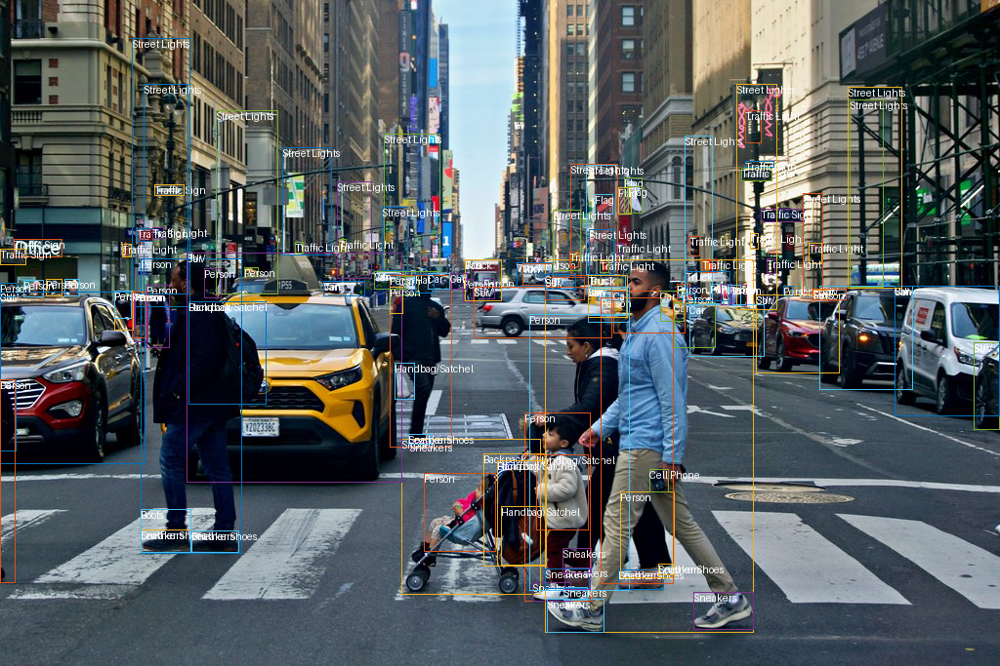

In [20]:
from PIL import ImageDraw

# visualize
# let's use Pillow's ImageDraw feature

annotated_image = image.copy()
draw = ImageDraw.Draw(annotated_image)

for i, result in enumerate(results):
    box = result["box"]
    color = tuple([int(x * 255) for x in COLORS[i]])
    xmin, ymin, xmax, ymax = box["xmin"], box["ymin"], box["xmax"], box["ymax"]
    draw.rectangle((xmin, ymin, xmax, ymax), fill=None, outline=color, width=1)
    draw.text((xmin, ymin, xmax, ymax), text=result["label"])

annotated_image

#### Visualize results from other checkpoints

ustc-community/dfine_n_coco


Device set to use cuda


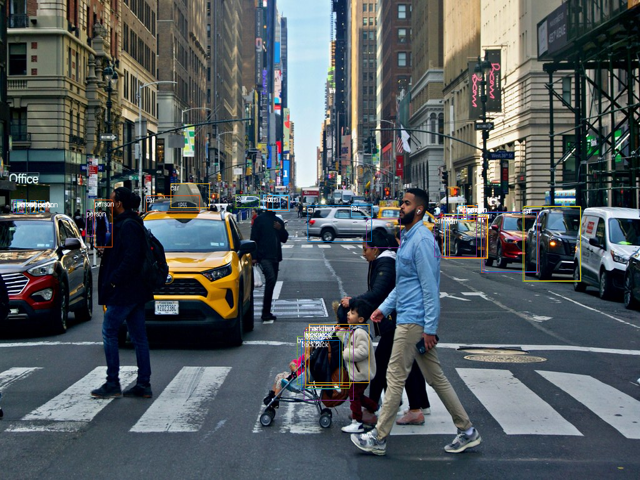

ustc-community/dfine_s_obj365


Device set to use cuda


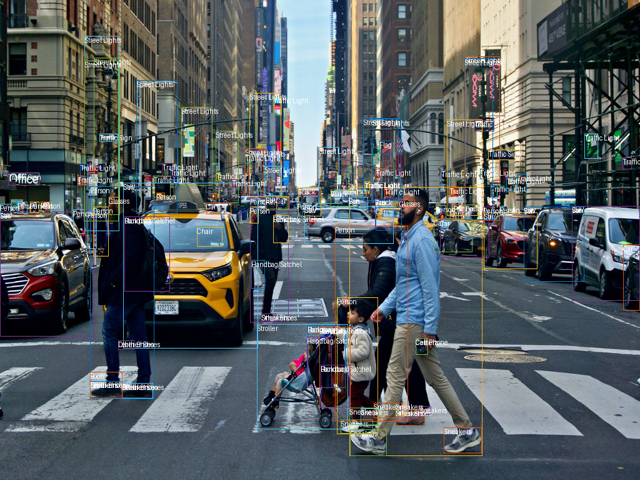

ustc-community/dfine_x_obj365


Device set to use cuda


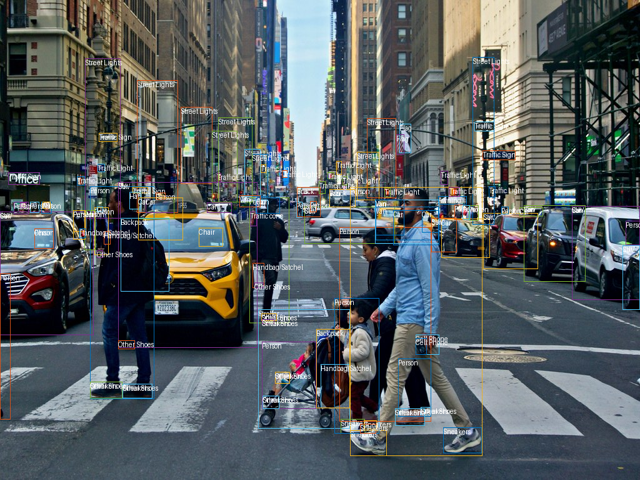

ustc-community/dfine_m_obj2coco


config.json:   0%|          | 0.00/6.97k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/78.7M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/470 [00:00<?, ?B/s]

Device set to use cuda


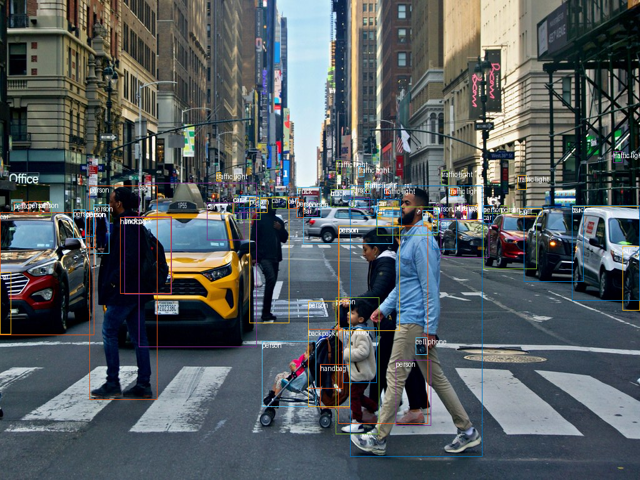

In [22]:
checkpoints = [
    "ustc-community/dfine-nano-coco",
    "ustc-community/dfine-small-obj365",
    "ustc-community/dfine-xlarge-obj365",
    "ustc-community/dfine-medium-obj2coco",
]

for checkpoint in checkpoints:
    print(checkpoint)
    pipe = pipeline(
        "object-detection", model=checkpoint, image_processor=checkpoint, device=device
    )
    results = pipe(image, threshold=0.3)

    annotated_image = image.copy()
    draw = ImageDraw.Draw(annotated_image)

    for i, result in enumerate(results):
        box = result["box"]
        color = tuple([int(x * 255) for x in COLORS[i]])
        xmin, ymin, xmax, ymax = box["xmin"], box["ymin"], box["xmax"], box["ymax"]
        draw.rectangle((xmin, ymin, xmax, ymax), fill=None, outline=color, width=1)
        draw.text((xmin, ymin, xmax, ymax), text=result["label"])

    display(annotated_image.resize([640, 480]))